# CNN 
* Pre trained using weights of 'best' model: densenet121_NotNorm.pth
* Use saliency maps for generation of bounding boxes

* test_loader is full test set but small_test_loader is smaller test set (12) for inspecting visual XAI

## Load Data

In [34]:
import os
from torch.utils.data import DataLoader, Dataset, random_split
from torchvision import transforms, models
from torch import nn, optim
import torch
from PIL import Image
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
import seaborn as sns
import time
import collections
from collections import Counter
from sklearn.model_selection import train_test_split

In [39]:

# Data class for DRData
class DRData_OLD(Dataset):
    def __init__(self, image_paths, labels, transform=None):
        self.image_paths = image_paths
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        image = Image.open(img_path).convert('RGB')
        label = self.labels[idx]

        if self.transform:
            image = self.transform(image)

        return image, label

# Example DRData class to include filenames
class DRData(Dataset):
    def __init__(self, image_paths, labels, transform=None):
        self.image_paths = image_paths
        self.labels = labels
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        image = Image.open(img_path).convert('RGB')
        label = self.labels[idx]

        if self.transform:
            image = self.transform(image)

        return image, label, img_path  # Return the image path along with the image and label

# Function to load data paths and labels from a directory
def load_image_paths_and_labels(root_dir, subset):
    image_paths = []
    labels = []

    subdir = f'{subset}/subset_ND'
    dir_path = os.path.join(root_dir, subdir)

    for filename in os.listdir(dir_path):
        if filename.endswith('.png'):
            image_paths.append(os.path.join(dir_path, filename))
            label = 1 if filename.split('_')[1].startswith('D') else 0  # 1 for DR, 0 for NO DR
            labels.append(label)

    return image_paths, labels


# Function to split the dataset in a stratified way
def stratified_split(image_paths, labels, test_size=0.15):
    train_paths, val_paths, train_labels, val_labels = train_test_split(
        image_paths, labels, test_size=test_size, stratify=labels, random_state=18
    )

    return train_paths, train_labels, val_paths, val_labels


# Define transforms (for example, resizing to 224x224 for Vision Transformers)
data_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])

root_dir = 'Data'

### TRAIN DATA ###
train_image_paths, train_labels = load_image_paths_and_labels(root_dir, subset='train')

# Perform the stratified split to ensure balanced train/val sets
train_paths, train_labels, val_paths, val_labels = stratified_split(train_image_paths, train_labels)

# Create the train and validation datasets
train_dataset = DRData(image_paths=train_paths, labels=train_labels, transform=data_transforms)
val_dataset = DRData(image_paths=val_paths, labels=val_labels, transform=data_transforms)

# Create DataLoaders
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False)


### TEST DATA ###
# normal test set
test_image_paths, test_labels = load_image_paths_and_labels(root_dir, subset='test')
test_dataset = DRData(image_paths=test_image_paths, labels=test_labels, transform=data_transforms)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False)

# small test set for inspecting visual xai outcomes: subset from test set called "SmallTestObvious"
small_test_image_paths, small_test_labels = load_image_paths_and_labels(root_dir, subset='testSMALL')
small_test_dataset = DRData(image_paths=small_test_image_paths, labels=small_test_labels, transform=data_transforms)
small_test_loader = DataLoader(small_test_dataset, batch_size=16, shuffle=False)



### Check distribution

In [40]:
# Check the distribution 
def check_data_distribution(labels, dataset_name='Dataset'):
    class_counts = Counter(labels)
    print(f"Data Distribution for {dataset_name}:")
    for label, count in class_counts.items():
        print(f"Class {label}: {count} samples")

check_data_distribution(train_labels, 'Training Dataset (Stratified)')
check_data_distribution(val_labels, 'Validation Dataset (Stratified)')
check_data_distribution(test_labels, 'Test Dataset (Stratified)')
check_data_distribution(small_test_labels, 'Test Dataset (Stratified)')

# train = 300 , test = 100. For train 0.85 train (255) and 15% val (45)

Data Distribution for Training Dataset (Stratified):
Class 0: 127 samples
Class 1: 128 samples
Data Distribution for Validation Dataset (Stratified):
Class 1: 22 samples
Class 0: 23 samples
Data Distribution for Test Dataset (Stratified):
Class 0: 50 samples
Class 1: 50 samples
Data Distribution for Test Dataset (Stratified):
Class 1: 6 samples
Class 0: 6 samples


## Train CNN (from best CNN of test_classification notebook)

In [17]:
""" 
Train
"""
def train_model(model, train_loader, val_loader, criterion, optimizer, scheduler, num_epochs, saveName): # in the paper 75 epochs, but +- 5min per epoch
    train_losses, val_losses = [], []
    train_accuracies, val_accuracies = [], []

    for epoch in range(num_epochs):
        start_time = time.time()  # Check time per epoch 

        model.train() # set model to train
        running_loss = 0.0
        correct = 0
        total = 0

        for inputs, labels in train_loader:
            inputs, labels = inputs.to(device), labels.to(device).float().unsqueeze(1)

            optimizer.zero_grad() # zero grads

            outputs = model(inputs)
            loss = criterion(outputs, labels)

            loss.backward() #compute gradients
            optimizer.step()

            running_loss += loss.item() * inputs.size(0) 

            predicted = torch.sigmoid(outputs).round()
            total += labels.size(0)
            correct += (predicted == labels).sum().item()

        scheduler.step() # update lr
        # for evaluation
        epoch_loss = running_loss / len(train_loader.dataset)
        train_accuracy = correct / total * 100
        train_losses.append(epoch_loss)
        train_accuracies.append(train_accuracy)

        # Validation 
        model.eval()
        val_running_loss = 0.0
        val_correct = 0
        val_total = 0
        
        with torch.no_grad():
            for inputs, labels in val_loader:
                inputs, labels = inputs.to(device), labels.to(device).float().unsqueeze(1)

                outputs = model(inputs)
                loss = criterion(outputs, labels)

                val_running_loss += loss.item() * inputs.size(0)

                predicted = torch.sigmoid(outputs).round()
                val_total += labels.size(0)
                val_correct += (predicted == labels).sum().item()

        #for evaluation
        val_loss = val_running_loss / len(val_loader.dataset)
        val_accuracy = val_correct / val_total * 100
        val_losses.append(val_loss)
        val_accuracies.append(val_accuracy)

        epoch_time = time.time() - start_time  # epoch time

        print(f'Epoch {epoch}/{num_epochs - 1}, '
              f'Train Loss: {epoch_loss:.4f}, Train Accuracy: {train_accuracy:.2f}%, '
              f'Val Loss: {val_loss:.4f}, Val Accuracy: {val_accuracy:.2f}%, '
              f'Time: {epoch_time:.2f} sec')

    # Plot train+val loss and acc
    epochs = range(num_epochs)
    plt.figure(figsize=(12, 4))
    plt.subplot(1, 2, 1)
    plt.plot(epochs, train_losses, label='Train Loss')
    plt.plot(epochs, val_losses, label='Val Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.subplot(1, 2, 2)
    plt.plot(epochs, train_accuracies, label='Train Accuracy')
    plt.plot(epochs, val_accuracies, label='Val Accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.show()

    # save weights
    torch.save(model.state_dict(), saveName)
    print("Model weights saved successfully.")

    return model 


Epoch 0/9, Train Loss: 0.0236, Train Accuracy: 87.84%, Val Loss: 0.2973, Val Accuracy: 48.89%, Time: 109.94 sec
Epoch 1/9, Train Loss: 0.0010, Train Accuracy: 100.00%, Val Loss: 0.0013, Val Accuracy: 100.00%, Time: 118.34 sec
Epoch 2/9, Train Loss: 0.0073, Train Accuracy: 97.25%, Val Loss: 0.0102, Val Accuracy: 95.56%, Time: 120.07 sec
Epoch 3/9, Train Loss: 0.0105, Train Accuracy: 95.69%, Val Loss: 0.0129, Val Accuracy: 88.89%, Time: 124.38 sec
Epoch 4/9, Train Loss: 0.0019, Train Accuracy: 99.61%, Val Loss: 0.0019, Val Accuracy: 100.00%, Time: 121.11 sec
Epoch 5/9, Train Loss: 0.0011, Train Accuracy: 99.22%, Val Loss: 0.0006, Val Accuracy: 100.00%, Time: 124.79 sec
Epoch 6/9, Train Loss: 0.0008, Train Accuracy: 100.00%, Val Loss: 0.0007, Val Accuracy: 100.00%, Time: 131.49 sec
Epoch 7/9, Train Loss: 0.0004, Train Accuracy: 100.00%, Val Loss: 0.0007, Val Accuracy: 100.00%, Time: 131.39 sec
Epoch 8/9, Train Loss: 0.0006, Train Accuracy: 99.61%, Val Loss: 0.0011, Val Accuracy: 100.00%, 

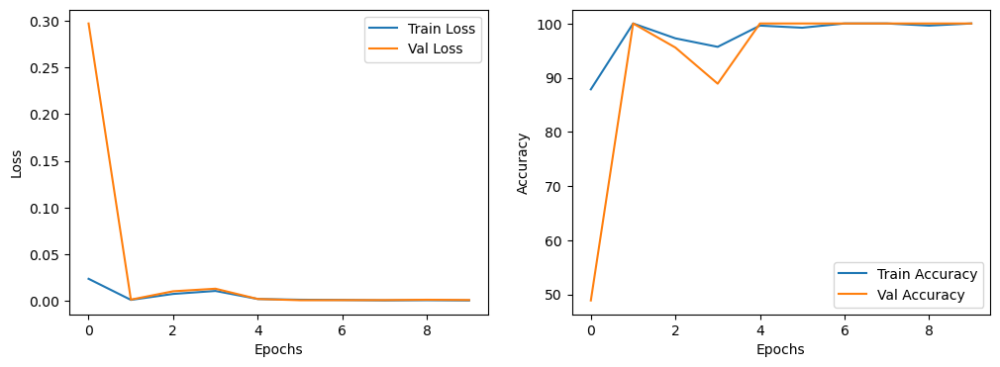

Model weights saved successfully.


In [19]:
import torch.nn.functional as F
# Define necessary params for model training 
#c2: " RETINA IMAGE AND DIABETIC RETINOPATHY: A DEEP LEARNING BASED APPROACH" 

# pre-trained DenseNet 121
model = models.densenet121(pretrained=True)

# binary classific
num_ftrs = model.classifier.in_features
model.classifier = nn.Linear(num_ftrs, 1) # replace last layer witg new fully connected layer for binary 

# Switch to GPU (colab?)
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model = model.to(device)

# Loss function: binary cross entropy loss with logits: binary cross entropy between target & iput logit 
# focal loss emphasizes hard-to-classify samples (c2)
def focal_loss(inputs, targets, alpha=0.25, gamma=2): #alpha for class imbalance, however, not case here
    BCE_loss = F.binary_cross_entropy_with_logits(inputs, targets, reduction='none') 
    pt = torch.exp(-BCE_loss) # prob per example: predicted prob of true class : pt is high = model is confident 
    F_loss = alpha * (1-pt)**gamma * BCE_loss # loss contribution lower for confident samples
    return F_loss.mean()

# adam optimizer & lr schedule: cosine annealing learning rate schedule 
optimizer = optim.Adam(model.parameters(), lr=1e-3)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=10)

# vars
num_epochs = 10
saveName = 'densenet121_Sept.pth' 

# Train the model
model = train_model(model, train_loader, val_loader, focal_loss, optimizer, scheduler, num_epochs, saveName)

## Evaluate CNN model (weights: densenet121_Sept.pth)

In [43]:
# evaluation of model on test set 
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Function to evaluate the model
def evaluate_model_OLD(model, test_loader):
    model.eval()
    all_labels = []
    all_preds = []

    with torch.no_grad():
        for inputs, labels in test_loader:
            inputs, labels = inputs.to(device), labels.to(device).float().unsqueeze(1)
            outputs = model(inputs)
            preds = torch.sigmoid(outputs).round()
            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(preds.cpu().numpy())

    accuracy = accuracy_score(all_labels, all_preds)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    cm = confusion_matrix(all_labels, all_preds)
    print(cm)

    print(f'Accuracy: {accuracy:.4f}')
    print(f'Precision: {precision:.4f}')
    print(f'Recall: {recall:.4f}')
    print(f'F1 Score: {f1:.4f}')

    # plt.figure(figsize=(6, 6))
    # sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
    # plt.xlabel('Predicted')
    # plt.ylabel('True')
    # plt.title('Confusion Matrix')
    # plt.show()

    return accuracy, precision, recall, f1

# Function to evaluate the model
def evaluate_model(model, test_loader):
    model.eval()
    all_labels = []
    all_preds = []

    with torch.no_grad():
        for inputs, labels, _ in test_loader:  # Add an underscore to ignore the image path
            inputs, labels = inputs.to(device), labels.to(device).float().unsqueeze(1)
            outputs = model(inputs)
            preds = torch.sigmoid(outputs).round()
            all_labels.extend(labels.cpu().numpy())
            all_preds.extend(preds.cpu().numpy())

    accuracy = accuracy_score(all_labels, all_preds)
    precision = precision_score(all_labels, all_preds)
    recall = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)
    cm = confusion_matrix(all_labels, all_preds)
    print(cm)

    print(f'Accuracy: {accuracy:.4f}')
    print(f'Precision: {precision:.4f}')
    print(f'Recall: {recall:.4f}')
    print(f'F1 Score: {f1:.4f}')

    return accuracy, precision, recall, f1

# Load the model if weights are saved already 
def load_model(saved_weights):
    model = models.densenet121(pretrained=True) # denseNet pre trained
    num_ftrs = model.classifier.in_features
    model.classifier = nn.Linear(num_ftrs, 1)
    model.load_state_dict(torch.load(saved_weights))
    model = model.to(device)
    return model

# evaluate model (not loading wights)
# Evaluate the model
#accuracy, precision, recall, f1 = evaluate_model(model, test_loader)

In [45]:
"""
evaluated on full test set 
"""
# Path to the saved model weights
saved_weights = 'CNNModelWeights/densenet121_Sept.pth'

# Use GPU if available
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Load the trained model
model = load_model(saved_weights)

# Evaluate the model
accuracy, precision, recall, f1 = evaluate_model(model, test_loader) 

# 1 = DR
# 0 = No DR

#true
# 0
# 1
#   0 1  predicted

/Users/berbervandrunen/anaconda3/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/berbervandrunen/anaconda3/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DenseNet121_Weights.IMAGENET1K_V1`. You can also use `weights=DenseNet121_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


[[41  9]
 [ 0 50]]
Accuracy: 0.9100
Precision: 0.8475
Recall: 1.0000
F1 Score: 0.9174


In [44]:
"""
evaluated on SMALL test set 
"""

small_model = load_model(saved_weights)

accuracy, precision, recall, f1 = evaluate_model(small_model, small_test_loader) 

[[4 2]
 [0 6]]
Accuracy: 0.8333
Precision: 0.7500
Recall: 1.0000
F1 Score: 0.8571


## Visual XAI

Individual visual XAI (Grad-CAM, saliency maps, integrated gradients shap lime ? )
* model = evaluated on test_loader
* small_model = evaluated on small_test_loader

Maybe best to use grad-CAM:

"Gradient-based techniques (Chaddad et al., 2023; Ennab & Mcheick, 2022), such as Grad-CAM, use gradients to create heatmaps, providing real-time visual explanations, while perturbation-based methods, like LIME, alter input data to observe changes in predictions, offering robust, model-agnostic explanations though often at higher computational cost."

In [26]:
#!pip install pytorch-gradcam

### GRAD CAM (model specific XAI: model internal workings) (also gradient based)

In [52]:
import numpy as np
import cv2
import torch.nn.functional as F

# GradCAM explanations 

"""
Extracting intermediate feature maps:
compute gradients of the target class wrt conv layer 
"""
class FeatureExtractor:
    """ extracting intermediate activations (feature maps) and registering gradients from target (conv) layers """
    def __init__(self, model, target_layers):
        self.model = model
        self.target_layers = target_layers
        self.gradients = []
        self.activations = []

    def save_gradient(self, grad):
        self.gradients.append(grad)

    def __call__(self, x):
        self.gradients = []
        self.activations = []
        for name, module in self.model.features._modules.items():
            x = module(x)
            if name in self.target_layers:
                x.register_hook(self.save_gradient)
                self.activations.append(x)
        return self.activations, x

"""
Generate grad-CAM for sinle image
>> feature extraction, prediction, backward pass for grad computation, generation of class activation map (CAM)
>> activations are output of the target conv layer
"""
def generate_heatmap(model, image, target_layer):
    extractor = FeatureExtractor(model, target_layer)
    model.eval()
    image = image.unsqueeze(0).to(device)

    # Forward pass to get predictions and target feature maps
    target_activations, output = extractor(image)
    output = F.relu(output, inplace=True)
    output = F.adaptive_avg_pool2d(output, (1, 1)).view(output.size(0), -1)
    output = model.classifier(output)
    pred_class = torch.sigmoid(output).round().item()

    # Backward pass: compute loss wrt predicted class
    model.zero_grad()
    class_loss = output[0]  # For binary classification
    class_loss.backward(retain_graph=True)

    #  gradients and target layer output
    gradients = extractor.gradients[0].cpu().data.numpy()
    target = target_activations[0].cpu().data.numpy()

    #  heatmap
    weights = np.mean(gradients, axis=(2, 3))[0, :] # gradients avg over spatial dims 
    cam = np.zeros(target.shape[2:], dtype=np.float32)

    for i, w in enumerate(weights):
        cam += w * target[0, i, :, :]

    cam = np.maximum(cam, 0)
    cam = cv2.resize(cam, (224, 224))
    cam = cam - np.min(cam)
    cam = cam / np.max(cam)

    #print(cam, pred_class)
    return cam, pred_class

# Visualize 
def visualize_heatmap(original_image, heatmap, image_name):
    heatmap = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)
    heatmap = np.float32(heatmap) / 255

    # Since normalization is skipped, directly convert the tensor to a numpy array
    original_image = original_image.cpu().permute(1, 2, 0).numpy()
    original_image = np.clip(original_image, 0, 1)
    
    superimposed_img = heatmap + np.float32(original_image)
    superimposed_img = superimposed_img / np.max(superimposed_img)
    
    fig, ax = plt.subplots(1, 2, figsize=(12, 6))
    
    # Original image 
    ax[0].imshow(original_image)
    ax[0].set_title(image_name)
    ax[0].axis('off')
    
    # Grad-CAM heatmap
    ax[1].imshow(superimposed_img)
    ax[1].set_title('Grad-CAM Heatmap')
    ax[1].axis('off')
    
    plt.show()

"""
Evaluate + Grad-CAM heatmaps
But only for images where the true label is 1 (only BB for DR images)
"""
def gradcam_xai(model, test_loader, device, target_layer, num_images):
    count = 0  # To count how many images we have visualized
    for images, labels, _ in test_loader:
        images = images.to(device)
        labels = labels.to(device)
        outputs = model(images)
        preds = torch.sigmoid(outputs).round().detach().cpu().numpy()  # Detach and convert to numpy
        
        for i in range(images.size(0)):  # Iterate over each image in the batch
            label = labels.cpu().numpy()[i]
            prediction = preds[i][0]

            # Only show when DR is present, i.e., label == 1
            if label == 1:  
                image_name = f"Actual: 1, Predicted: {prediction}"

                # Grad-CAM heatmap
                heatmap, pred_class = generate_heatmap(model, images[i], target_layer)

                # Visualize heatmap with the image label/name as title
                visualize_heatmap(images[i], heatmap, image_name)
                
                count += 1

            # Stop once we have visualized `num_images` images with `label == 1`
            if count >= num_images:
                break

        # Break the outer loop as well if enough images are visualized
        if count >= num_images:
            break



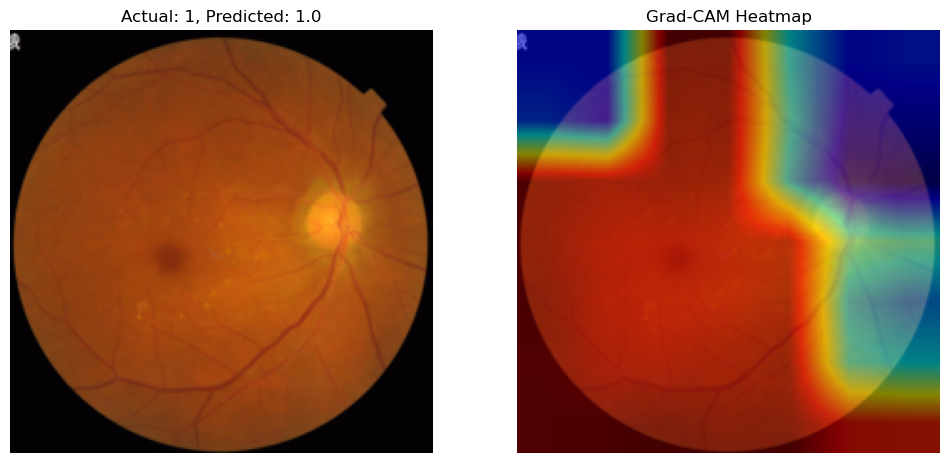

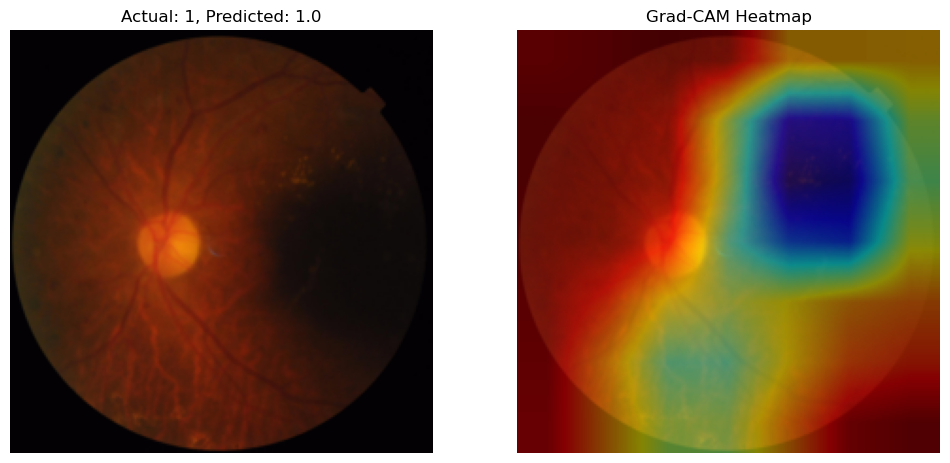

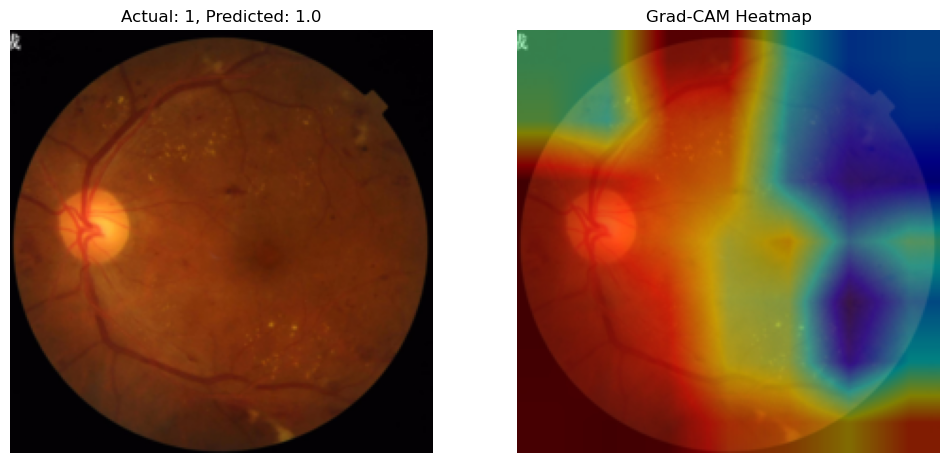

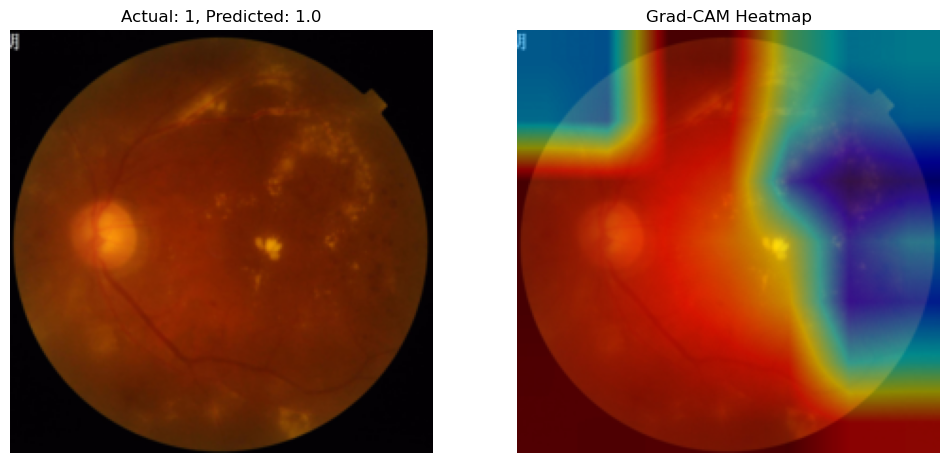

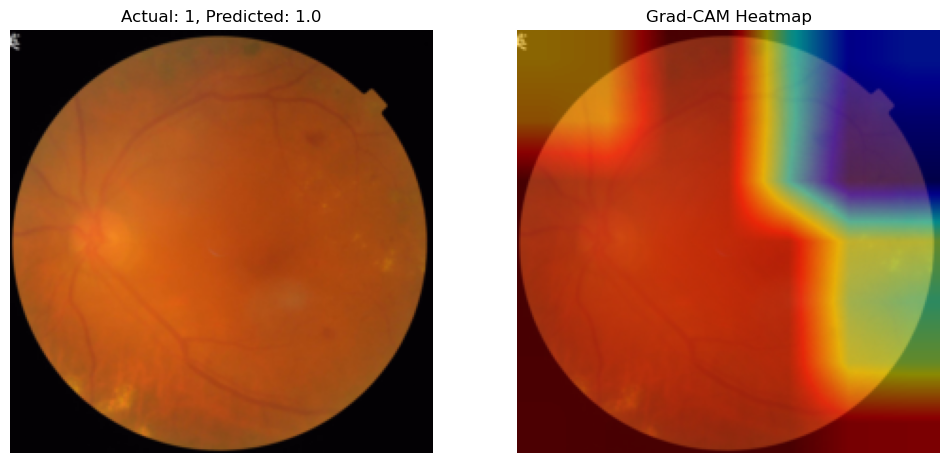

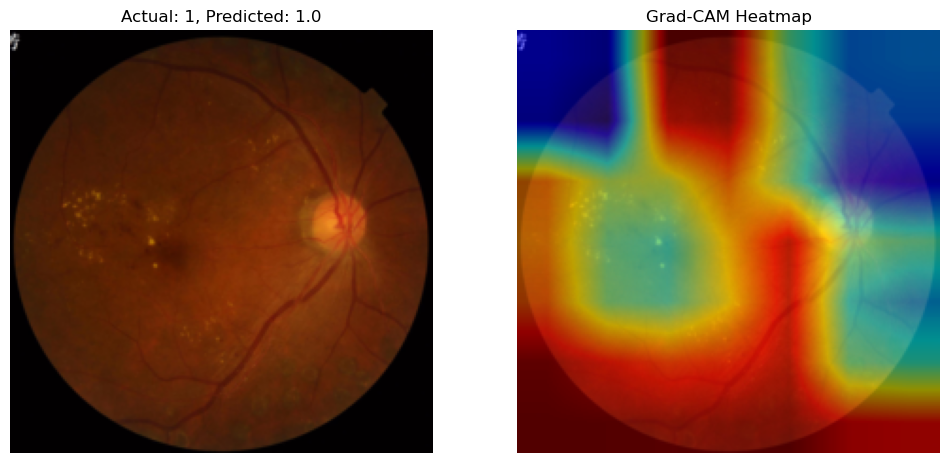

In [53]:
""" on SMALL TEST set small_model and small_test_loader) """

# ! only visualizes DR cases
gradcam_xai(small_model, small_test_loader, device, target_layer=['denseblock4'], num_images=6)

Grad-Cam: computes importance of each feature map (activation) by looking at the gradients of the predicted class wrt the target conv layer. 
- Method/interpretation: highlights areas of image that contributed most to the prediction.

### LIME (local XAI: focus on individual preduictions (local vars))

In [25]:
#!pip install lime

In [56]:
import matplotlib.pyplot as plt
import numpy as np
from lime import lime_image
from skimage.segmentation import mark_boundaries
import torch

# Prediction function for LIME
# returns class probs 
def predict_fn(images):
    images = np.transpose(images, (0, 3, 1, 2))  # LIME uses (H, W, C) ; convert to pytorch format: (C, H, W)
    images = torch.tensor(images).float().to(device) # convert to tensr
    
    with torch.no_grad():
        outputs = model(images) # pass img through model
        probs = torch.sigmoid(outputs).cpu().numpy()  # Use sigmoid bc binary classification
    
    return np.concatenate([1 - probs, probs], axis=1)  # Return probs for dr and no dr

#  LIME for all positive DR images
def lime_xai(model, data_loader, device):
    """
    Function to visualize LIME explanations for all images labeled as DR (1) 
    
    Parameters:
    - model: trained model for DR detection.
    - data_loader: DataLoader containing the images  
    - device: The device (CPU/GPU) where the model and data reside.
    """
    model.eval()  # Set the model to evaluation mode
    
    for images, labels, _ in data_loader:
        # Move tensors to the CPU and convert to numpy arrays for LIME
        images_np = images.cpu().numpy()
        labels_np = labels.cpu().numpy()

        # Iterate over each image + label in the batch
        for i in range(len(images_np)):
            label = labels_np[i]
            if label == 1:  # Only explanations for DR (label 1)
                image = images_np[i].transpose((1, 2, 0))  # Convert to HWC format for visualization

                # Plot original image
                plt.figure(figsize=(8, 8))
                plt.subplot(1, 2, 1)
                plt.imshow(image)
                plt.title('Original Image (DR)')
                plt.axis('off')

                # LIME explainer object
                explainer = lime_image.LimeImageExplainer()
                # Generate LIME explanation
                explanation = explainer.explain_instance(image, predict_fn, top_labels=2, hide_color=0, num_samples=1000)
                # predict_fn retunrs the class probs 

                # Get img and mask for the explanation
                temp, mask = explanation.get_image_and_mask(
                    label=int(label),  # The true label of the image
                    positive_only=False, 
                    num_features=10, # top n features eg top n contributing super pixels 
                    hide_rest=False
                )

                # Plot LIME explanation
                plt.subplot(1, 2, 2)
                plt.imshow(mark_boundaries(temp, mask))
                plt.title('LIME Explanation (DR)')
                plt.axis('off')

                plt.show()  # Display the original and explanation side by side


  0%|          | 0/1000 [00:00<?, ?it/s]

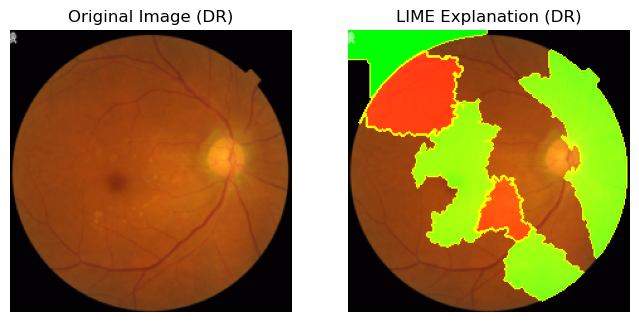

  0%|          | 0/1000 [00:00<?, ?it/s]

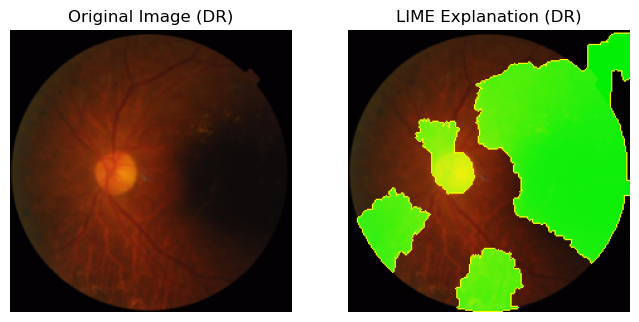

  0%|          | 0/1000 [00:00<?, ?it/s]

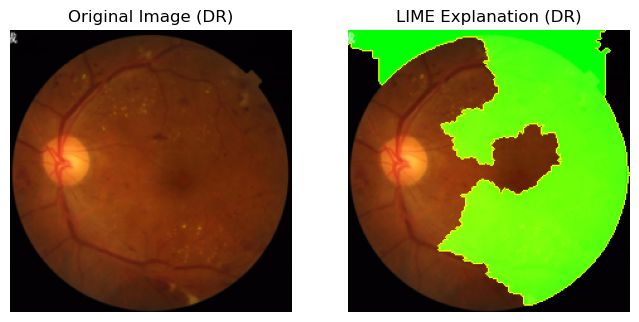

  0%|          | 0/1000 [00:00<?, ?it/s]

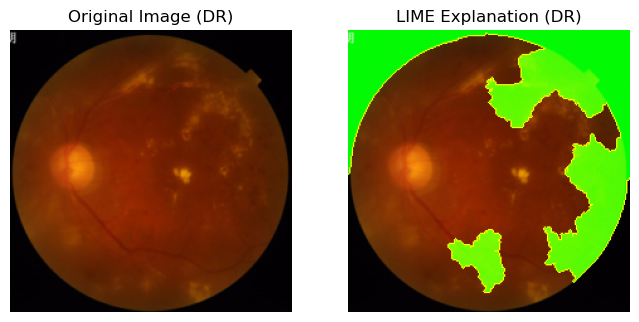

  0%|          | 0/1000 [00:00<?, ?it/s]

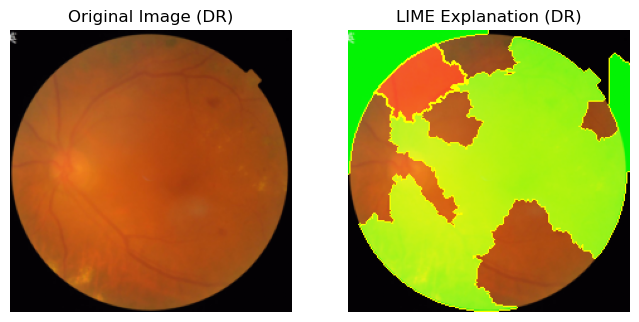

  0%|          | 0/1000 [00:00<?, ?it/s]

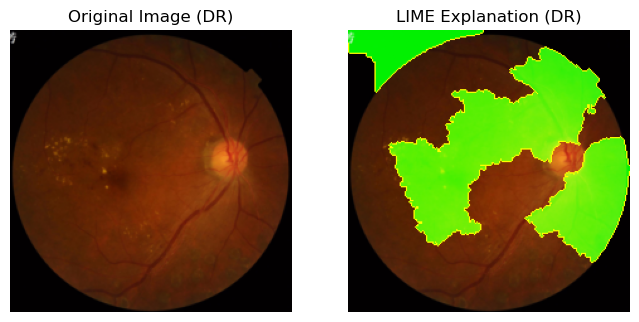

In [57]:
# get lime xai 
lime_xai(small_model, small_test_loader, device)


LIME (Local Interpretable Model-agnostic Explanations)
- method: divide img in superpizels distorting the full img and see the effect of changes in this on the output of the model 
- interpretation: regions (superpixels) highlighted = evidence for class prediction
    - Green: positive contribution
    - Red: negative contributin for the predicted class


### INTEGRATED GRADIETS

In [58]:
import matplotlib.pyplot as plt
import numpy as np
import torch

"""
Computer integrated grads for input img and returns importance scores for each pizel in the img
"""
def integrated_gradients(model, image, steps=50):
    model.eval()
    
    baseline = torch.zeros_like(image).to(device)  # Baseline: black image
    # Compute scaled inputs between the baseline and the actual image
    scaled_inputs = [baseline + (float(i) / steps) * (image - baseline) for i in range(steps+1)]
    scaled_inputs = torch.stack(scaled_inputs).to(device)

    # forward pass + calc grads
    grads = []
    for scaled_image in scaled_inputs:
        scaled_image.requires_grad_()
        output = model(scaled_image.unsqueeze(0).to(device)) # forward pass
        score = output.squeeze()
        model.zero_grad() # zero out the grads
        score.backward() # backprop to get grads
        grads.append(scaled_image.grad.data.clone()) #store grads
    
    avg_grads = torch.mean(torch.stack(grads), dim=0) # avg grads over all steps

    # intregrated grads: multiply diff between input and baseline by avg grad
    integrated_grads = (image - baseline) * avg_grads
    integrated_grads = integrated_grads.sum(dim=0).cpu().numpy() # sum over all channels

    # Normalize integrated gradients
    integrated_grads = (integrated_grads - integrated_grads.min()) / (integrated_grads.max() - integrated_grads.min())
    
    return integrated_grads

# Visualize Integrated Gradients with Original Image

# ???
# maybe more contrast> threshold? 
# ???

def visualize_integrated_gradients(original_image, igrads, image_name):
    fig, ax = plt.subplots(1, 2, figsize=(12, 6))
    
    # Original image
    ax[0].imshow(original_image.permute(1, 2, 0).cpu().numpy(), cmap='gray')
    ax[0].set_title(image_name)
    ax[0].axis('off')
    
    # Integrated gradients heatmap overlay
    ax[1].imshow(original_image.permute(1, 2, 0).cpu().numpy(), cmap='gray')
    ax[1].imshow(igrads, cmap='inferno', alpha=0.5)
    ax[1].set_title('Integrated Gradients')
    ax[1].axis('off')

    plt.show()

 
# vidualise for all pos img
def integrated_gradients_xai(model, test_loader, device, num_images=6):
    count = 0
    model.eval()

    for images, labels, _ in test_loader:
        images, labels = images.to(device), labels.to(device)

        for i in range(images.size(0)):
            image, label = images[i], labels[i].item()
            output = model(image.unsqueeze(0)).squeeze()
            pred = torch.sigmoid(output).round().item()

            # Only visualize for positive DR predictions (label == 1)
            if pred == 1:
                # Generate integrated gradients
                igrads = integrated_gradients(model, image)
                
                # original image + integrated gradients
                image_name = f"Actual: {label}, Predicted: {int(pred)}"
                visualize_integrated_gradients(image, igrads, image_name)
                
                count += 1
                if count >= num_images:
                    return  # stop after num_img reached


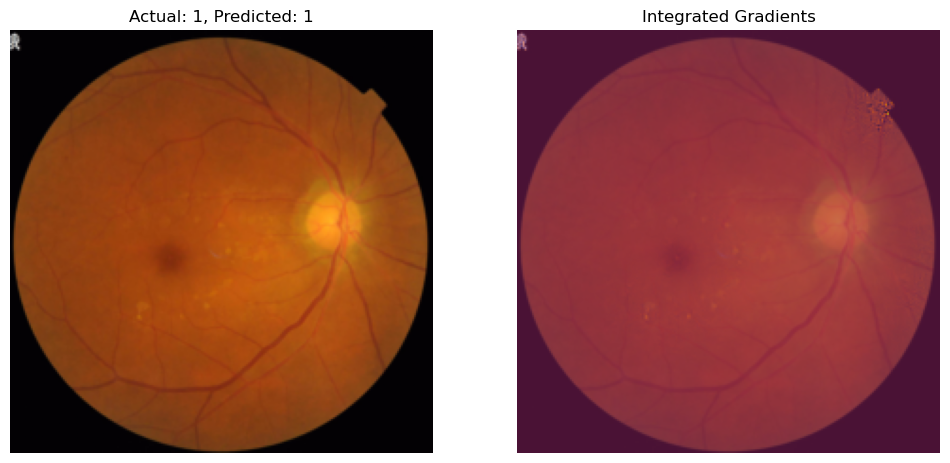

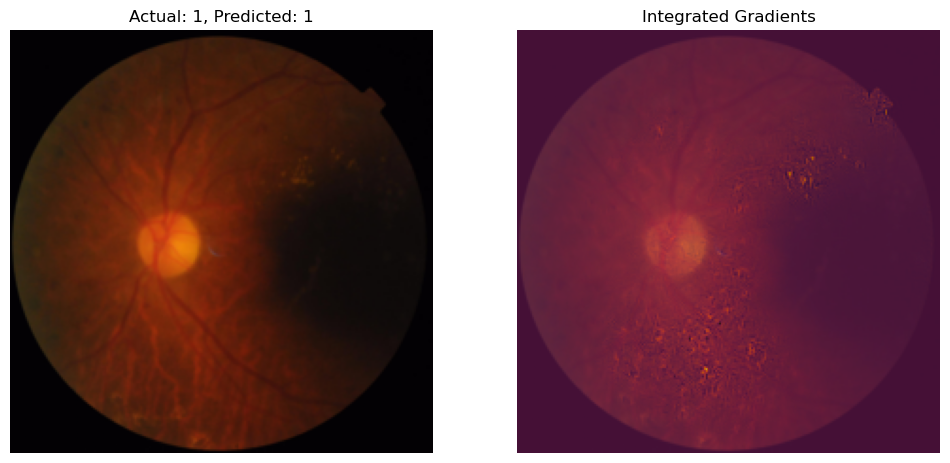

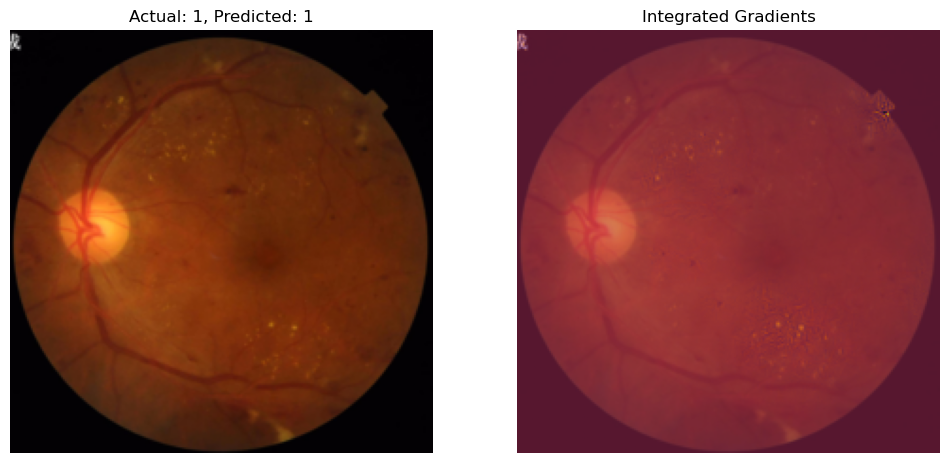

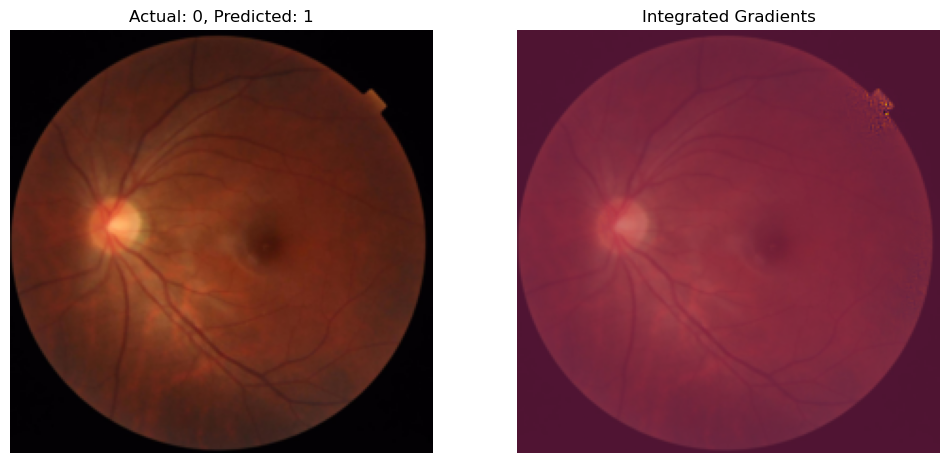

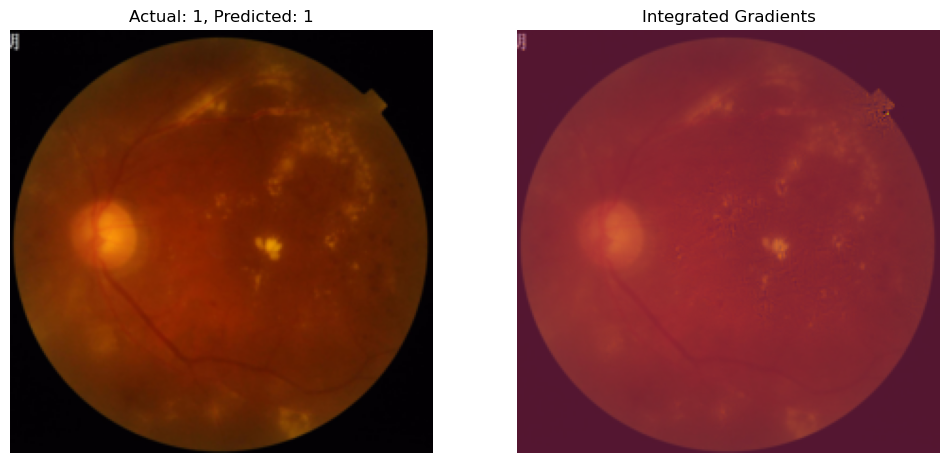

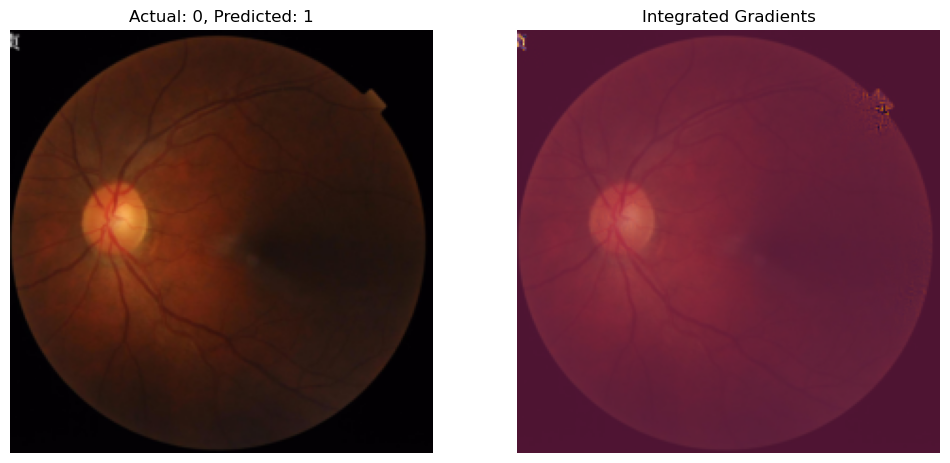

In [59]:
# Call the function to evaluate and visualize
integrated_gradients_xai(small_model, small_test_loader, device, num_images=6)


Integrated Gradients: explain predictions by attributing the importance of each input feature (e.g., pixel) to the final prediction. 
- Compare input img to baseline img (0/blck)
- calculate grads of model output wrt input: does it multiple times instead of 1 and then accumulates the gradients.
- not layer bounded
- Interpretation:
  - Brighter = high intensity = high integrated gradients = most important
  - Darker = low internsity = lower importance and less contribution
- can add: thresholding for clearer vis

### OCCLUSION SENSITIVITY

In [61]:
import matplotlib.pyplot as plt
import numpy as np
import torch

# Occlusion Sensitivity func
# occlusion_size can be smaller or bigger
def occlusion_sensitivity(model, image, occlusion_size=10):
    model.eval()
    image = image.unsqueeze(0).to(device)
    heatmap = np.zeros(image.squeeze().shape[1:])  # Initialize the heatmap
    
    for i in range(0, image.size(2), occlusion_size):  # Loop over image rows
        for j in range(0, image.size(3), occlusion_size):  # Loop over image columns
            occluded_image = image.clone()  # Create a copy of the image
            occluded_image[:, :, i:i+occlusion_size, j:j+occlusion_size] = 0  # Mask part of the image
            
            output = model(occluded_image)  # Forward pass  
            prediction = output.item()  # Get prediction 
            
            heatmap[i:i+occlusion_size, j:j+occlusion_size] = prediction  # Update heatmap with prediction 
    
    # Normalize heatmap to be in the range [0, 1]
    heatmap = (heatmap - heatmap.min()) / (heatmap.max() - heatmap.min())
    
    return heatmap

#  Plot original image and occlusion sensitivity heatmap
def visualize_occlusion(heatmap, original_image, image_name):
    fig, ax = plt.subplots(1, 2, figsize=(12, 6))
    
    # Original img
    ax[0].imshow(original_image.permute(1, 2, 0).cpu().numpy(), cmap='gray')
    ax[0].set_title(f'Original Image: {image_name}')
    ax[0].axis('off')
    
    # Heatmap overlay
    ax[1].imshow(original_image.permute(1, 2, 0).cpu().numpy(), cmap='gray')
    ax[1].imshow(heatmap, cmap='coolwarm', alpha=0.5)  # Overlay heatmap on original image
    ax[1].set_title('Occlusion Sensitivity')
    ax[1].axis('off')
    
    plt.show()

# Get occ sensitivity and original img
def occlusion_sensitivity_xai(model, test_loader, device, num_images=6, occlusion_size=10):
    count = 0  # Counter for visualized images
    model.eval()
    
    for images, labels, _ in test_loader:
        images, labels = images.to(device), labels.to(device)
        
        for i in range(images.size(0)):
            image, label = images[i], labels[i].item()
            output = model(image.unsqueeze(0)).squeeze()
            pred = torch.sigmoid(output).round().item()

            # Visualize only if the model predicts diabetic retinopathy (DR, label == 1)
            if pred == 1:
                # Generate occlusion sensitivity heatmap
                heatmap = occlusion_sensitivity(model, image, occlusion_size=occlusion_size)
                
                # Visualize original image and heatmap
                image_name = f"Actual: {label}, Predicted: {int(pred)}"
                visualize_occlusion(heatmap, image, image_name)
                
                count += 1
                if count >= num_images:
                    return  # Stop after visualizing the desired number of images


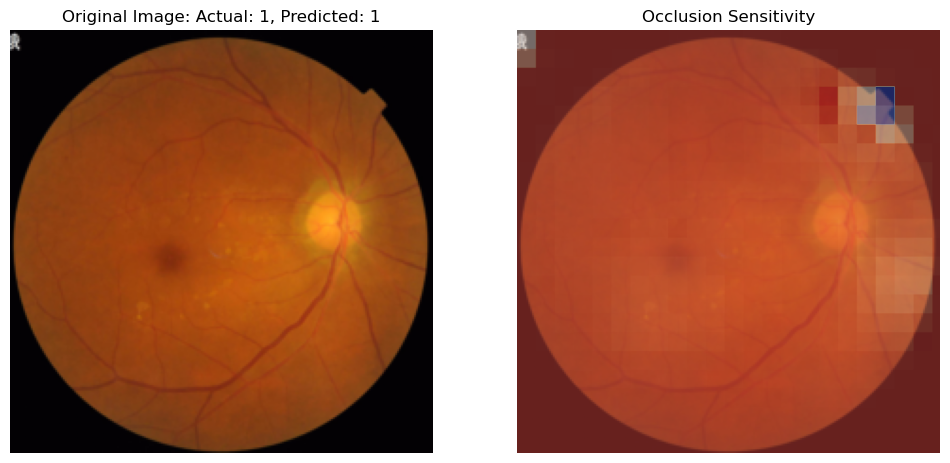

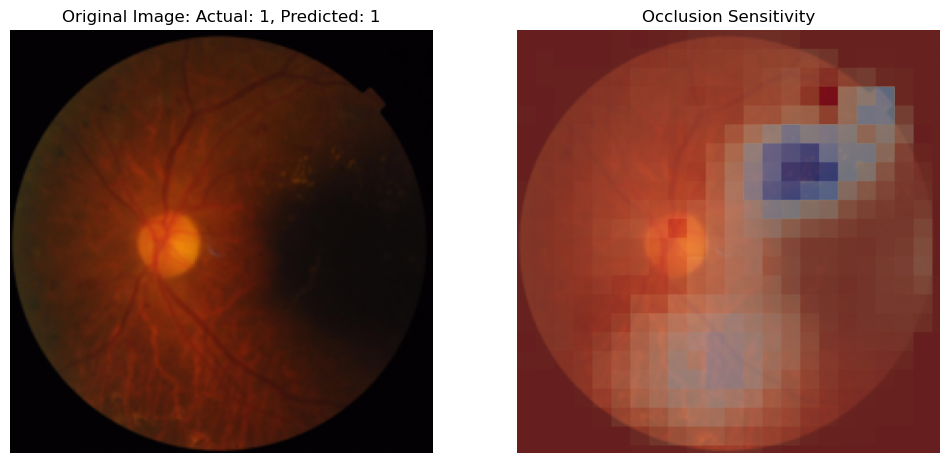

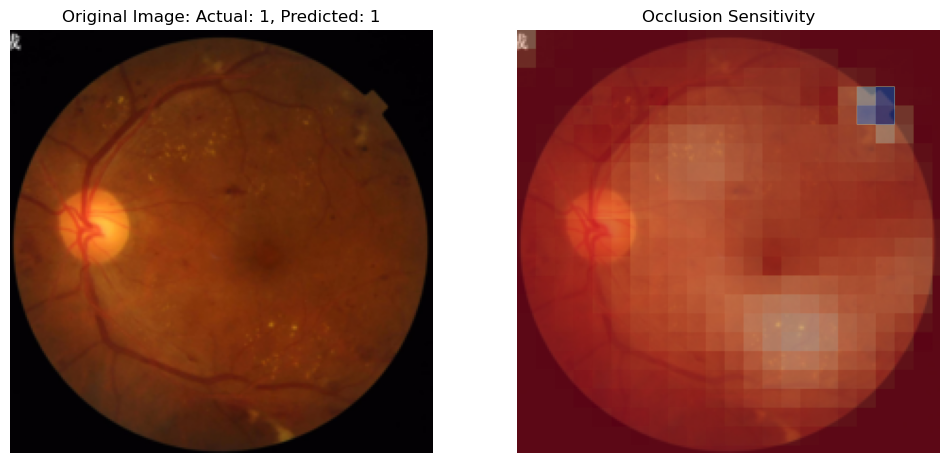

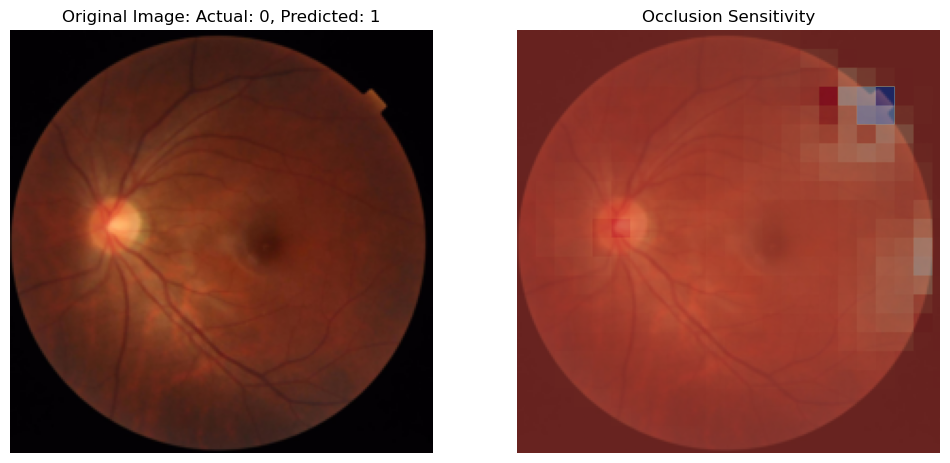

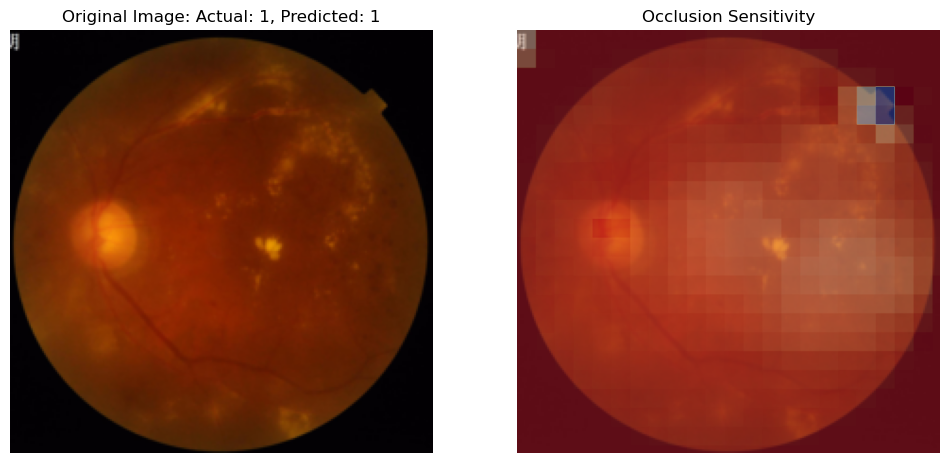

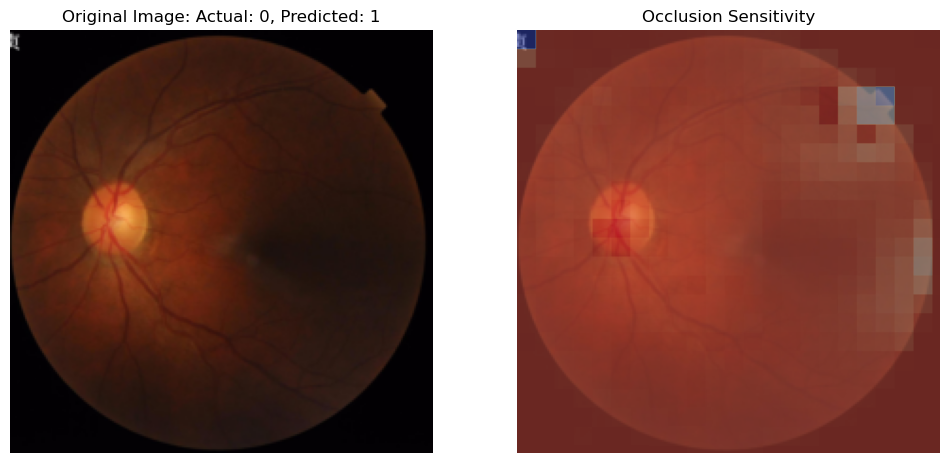

In [62]:
occlusion_sensitivity_xai(small_model, small_test_loader, device, num_images=6, occlusion_size=10)

Occlusion Sensitivity: how senesitive the model is to specific parts of the input img : occluding (masking out) small patches and see change in predictions to indicate most important regions
- occluding = masking pixels as black
- method = model agnistic (don't look at grads) and hence localization 
- Interpretation: more sensitive regions = higher hetamap value = brighter


### SALIENCY

error you're encountering is due to the use of in-place operations (such as ReLU(inplace=True)) inside the DenseNet model. These operations are interfering with the backward pass and gradient computations required for saliency maps and SHAP. To resolve this, we need to modify the model to avoid using in-place operations during the forward pass

In [115]:
# for param in small_model.parameters():
    # param.requires_grad = True

In [63]:
import torch
import matplotlib.pyplot as plt
import numpy as np

# Function to generate saliency map
def generate_saliency_map_Single(model, image):
    image.requires_grad_()  # Enable gradients on the image
    
    # Forward pass
    model.eval()
    output = model(image)
    
    # Get the scalar score (output) for binary classification
    score = output[0]  # For binary classification, there's only one output

    # Backprop to calculate gradients
    model.zero_grad()
    score.backward()
    
    # Get the gradient of the input image
    saliency = image.grad.data.abs().squeeze().cpu().numpy()

    # Normalize the saliency map
    saliency = np.max(saliency, axis=0)
    saliency = (saliency - saliency.min()) / (saliency.max() - saliency.min() + 1e-7)  # Avoid division by zero
    
    return saliency, output.sigmoid().item()  # Return both saliency and predicted score

def generate_saliency_map(model, image):
    image = image.unsqueeze(0).to(device)  # Add batch dimension (unsqueeze) and move to device
    image.requires_grad_()  # Enable gradients on the image
    
    # Forward pass
    model.eval()
    output = model(image)
    
    # Get the scalar score (output) for binary classification
    score = output[0]  # For binary classification, there's only one output

    # Backprop to calculate gradients
    model.zero_grad()
    score.backward()
    
    # Get the gradient of the input image
    saliency = image.grad.data.abs().squeeze().cpu().numpy()

    # Normalize the saliency map
    saliency = np.max(saliency, axis=0)
    saliency = (saliency - saliency.min()) / (saliency.max() - saliency.min() + 1e-7)  # Avoid division by zero
    
    return saliency, output.sigmoid().item()  # Return both saliency and predicted score


# Function to visualize original image next to saliency map
def visualize_saliency_map(image, saliency_map, true_label, pred_label, image_idx):
    # Detach image from the computation graph and convert it to a numpy array
    original_image = image.detach().squeeze().cpu().permute(1, 2, 0).numpy()
    original_image = np.clip(original_image, 0, 1)  # Ensure the pixel values are between 0 and 1
    
    # Plot the original image and saliency map side by side
    plt.figure(figsize=(10, 5))
    
    # Original image
    plt.subplot(1, 2, 1)
    plt.imshow(original_image)
    plt.axis('off')
    plt.title(f'Original Image {image_idx}')
    
    # Saliency map
    plt.subplot(1, 2, 2)
    plt.imshow(original_image, cmap='gray')
    plt.imshow(saliency_map, cmap='hot', alpha=0.5)
    plt.axis('off')
    plt.title(f'True: {true_label}, Predicted: {round(pred_label)}')
    
    plt.show()


# Loop through the test loader, filter images with label 1 (DR), and generate saliency maps
def saliency_xai(model, test_loader):
    image_idx = 0  # To keep track of image number
    
    for batch_images, batch_labels, _ in test_loader:
        for i, (image, label) in enumerate(zip(batch_images, batch_labels)):
            if label.item() == 1:  # Only consider images with DR (label 1)
                image_idx += 1  # Increment image counter
                
                # Move image to the correct device and unsqueeze for batch size of 1
                image = image.unsqueeze(0).to(device)
                
                # Generate saliency map and get the predicted label
                saliency_map, pred_label = generate_saliency_map_Single(model, image)
                
                # Visualize the original image next to the saliency map with true and predicted labels
                visualize_saliency_map(image, saliency_map, true_label=label.item(), pred_label=pred_label, image_idx=image_idx)



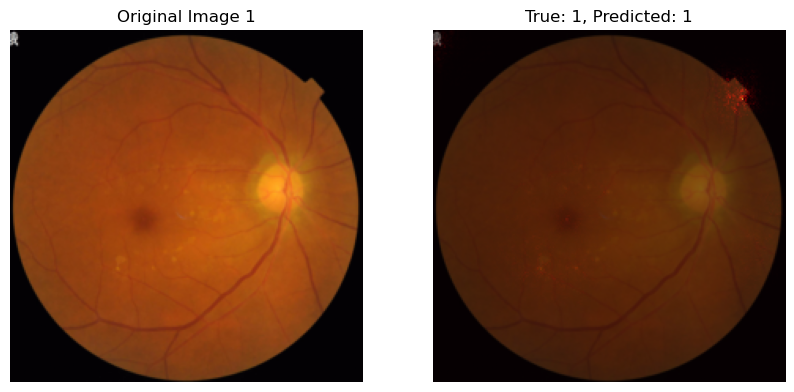

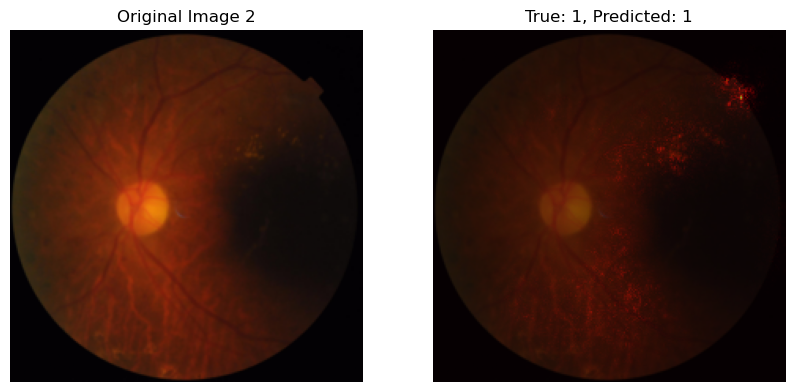

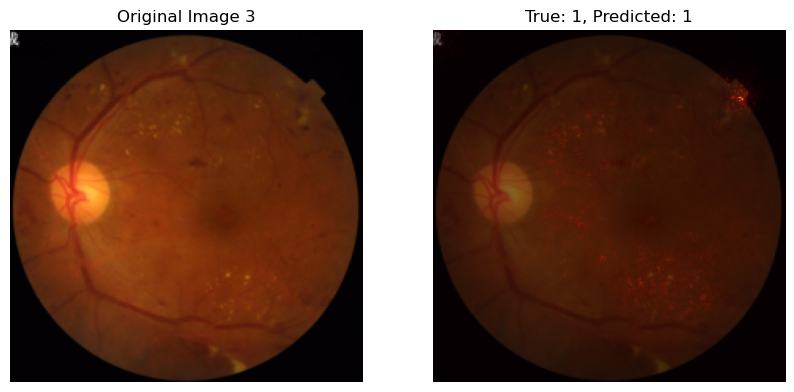

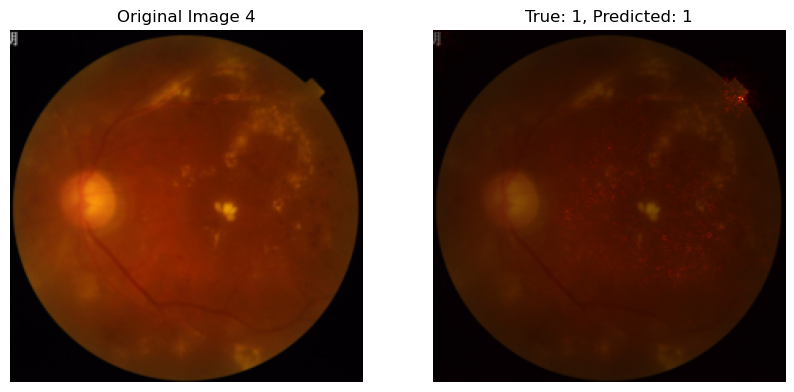

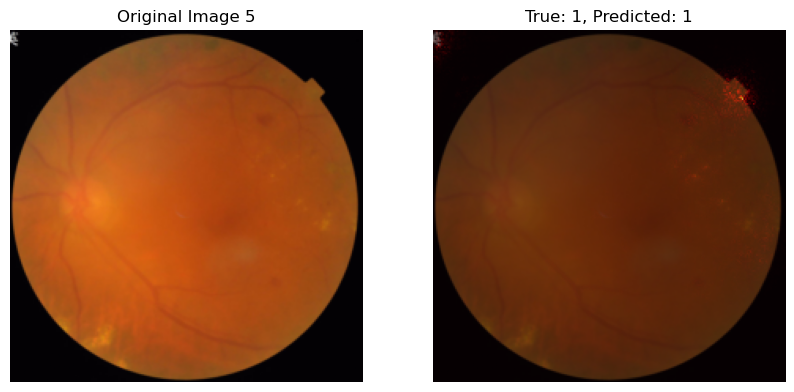

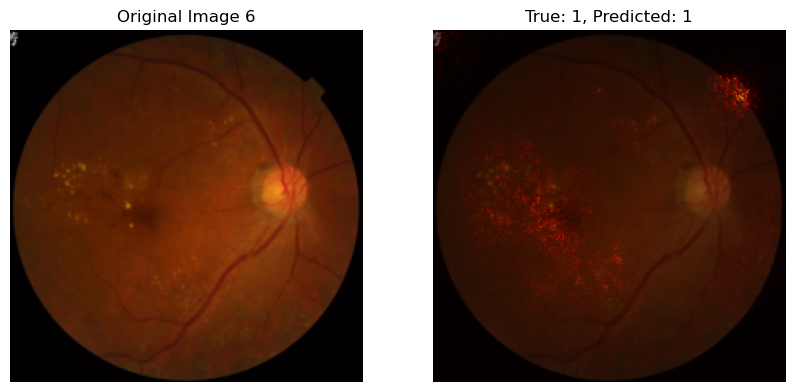

In [64]:
# Call the function to visualize saliency maps for DR images
saliency_xai(small_model, small_test_loader)


Saliency maps: highlight regions that have highest influence via computation of gradients of outputs wrt to input img
- Magnitude of grads indicate important pixels (so don't care abt direction but the absolute value: indicating importance)

### COMBINED ALL OF THE ABOVE (5)

  0%|          | 0/1000 [00:00<?, ?it/s]

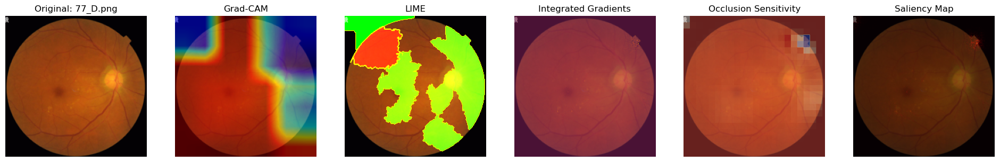

Saved and displayed XAI comparison to xai_comparison_1.png


  0%|          | 0/1000 [00:00<?, ?it/s]

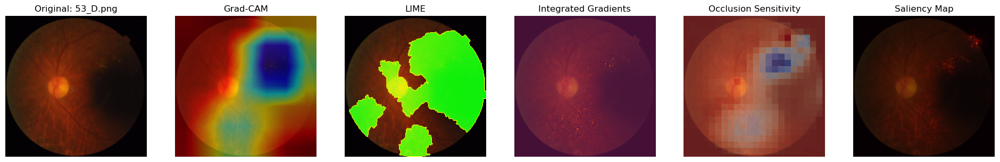

Saved and displayed XAI comparison to xai_comparison_2.png


  0%|          | 0/1000 [00:00<?, ?it/s]

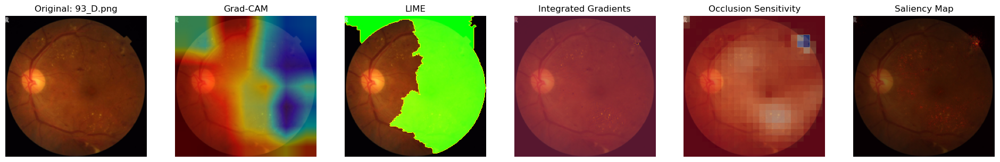

Saved and displayed XAI comparison to xai_comparison_3.png


  0%|          | 0/1000 [00:00<?, ?it/s]

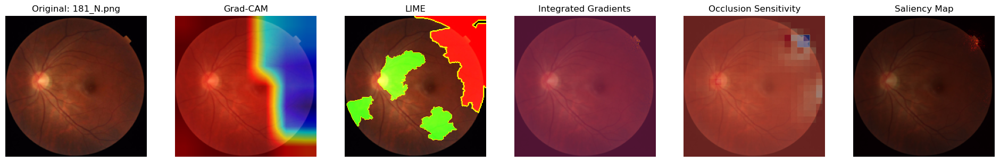

Saved and displayed XAI comparison to xai_comparison_4.png


  0%|          | 0/1000 [00:00<?, ?it/s]

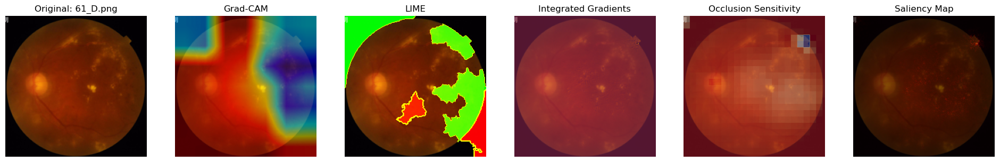

Saved and displayed XAI comparison to xai_comparison_5.png


  0%|          | 0/1000 [00:00<?, ?it/s]

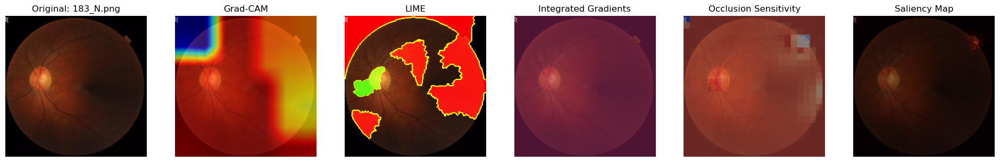

Saved and displayed XAI comparison to xai_comparison_6.png


In [66]:
import torch
import matplotlib.pyplot as plt
import numpy as np
import cv2
from lime import lime_image
from skimage.segmentation import mark_boundaries

# Helper to save and show image comparison
def save_and_show_comparison_plot(filename):
    plt.savefig(filename, bbox_inches='tight')
    plt.show()  # This will display the figure on screen
    plt.close()

# Full XAI Comparison Function with saving and showing
def xai_comparison(model, test_loader, device, target_layer=['denseblock4'], num_images=6, occlusion_size=10):
    count = 0
    model.eval()
    saved_figures = []  # To store figures for returning

    for images, labels, _ in test_loader:
        images, labels = images.to(device), labels.to(device)
        
        for i in range(images.size(0)):
            image, label = images[i], labels[i].item()
            output = model(image.unsqueeze(0)).squeeze()
            pred = torch.sigmoid(output).round().item()

            # Only process images predicted as DR (label == 1)
            if pred == 1:
                # Create a figure with a subplot for each explanation method
                fig, axes = plt.subplots(1, 6, figsize=(24, 6))  # 1 row, 6 columns (Original + 5 XAI methods)
                axes = axes.ravel()

                # Prepare the original image
                original_image = image.permute(1, 2, 0).cpu().numpy()
                original_image = np.clip(original_image, 0, 1)
                axes[0].imshow(original_image)
                axes[0].set_title('Original')
                axes[0].axis('off')

                # 1. Grad-CAM
                heatmap, _ = generate_heatmap(model, image, target_layer)
                gradcam_overlay = cv2.applyColorMap(np.uint8(255 * heatmap), cv2.COLORMAP_JET)
                gradcam_overlay = np.float32(gradcam_overlay) / 255
                gradcam_image = gradcam_overlay + np.float32(original_image)
                gradcam_image = gradcam_image / np.max(gradcam_image)
                axes[1].imshow(gradcam_image)
                axes[1].set_title('Grad-CAM')
                axes[1].axis('off')

                # 2. LIME
                image_np = image.cpu().numpy().transpose((1, 2, 0))  # Convert to HWC for LIME
                explainer = lime_image.LimeImageExplainer()
                explanation = explainer.explain_instance(image_np, predict_fn, top_labels=2, hide_color=0, num_samples=1000)
                temp, mask = explanation.get_image_and_mask(label=int(label), positive_only=False, num_features=10, hide_rest=False)
                lime_image_overlay = mark_boundaries(temp, mask)
                axes[2].imshow(lime_image_overlay)
                axes[2].set_title('LIME')
                axes[2].axis('off')

                # 3. Integrated Gradients
                igrads = integrated_gradients(model, image)
                axes[3].imshow(original_image, cmap='gray')
                axes[3].imshow(igrads, cmap='inferno', alpha=0.5)
                axes[3].set_title('Integrated Gradients')
                axes[3].axis('off')

                # 4. Occlusion Sensitivity
                heatmap = occlusion_sensitivity(model, image, occlusion_size=occlusion_size)
                axes[4].imshow(original_image, cmap='gray')
                axes[4].imshow(heatmap, cmap='coolwarm', alpha=0.5)
                axes[4].set_title('Occlusion Sensitivity')
                axes[4].axis('off')

                # 5. Saliency Map
                saliency_map, _ = generate_saliency_map_Single(model, image.unsqueeze(0).to(device))
                axes[5].imshow(original_image, cmap='gray')
                axes[5].imshow(saliency_map, cmap='hot', alpha=0.5)
                axes[5].set_title('Saliency Map')
                axes[5].axis('off')

                # Save and show the plot
                filename = f'xai_comparison_{count+1}.png'
                save_and_show_comparison_plot(filename)
                print(f"Saved and displayed XAI comparison to {filename}")

                # Store the figure for returning
                saved_figures.append(fig)

                count += 1
                if count >= num_images:
                    return saved_figures  # Return all saved figures for further use

    return saved_figures  # Return saved figures even if not `num_images`

# Call the function to run XAI comparison
saved_figures = xai_comparison(small_model, small_test_loader, device, target_layer=['denseblock4'], num_images=6, occlusion_size=10)

# these are the predicted ones!!